# 12.프로젝트 : CIFAR-10 이미지 생성하기

## 이론 및 모델 설명
### 생성 모델링(Generative Modeling)
생성 모델링은 기존의 데이터셋에서 각 이미지의 특징을 학습해 그와 비슷한 새로운 데이터셋을 만든다. 실제 데이터셋과 거의 구별이 어려울 정도로 좋은 품질의 데이터셋을 만들어내는 것이 생성 모델링의 최종 목표이다. 생성 모델에는 그림을 사진으로 변환하는 Pix2Pix, 각 데이터셋의 스타일을 각각 학습해 새로운 이미지에 스타일을 입히는 CycleGAN, 이미지의 스타일을 변화시키는 Neural Style Transfer, 이번 프로젝트에서 다룰 GAN 등이 있다. 

### GAN(Generative Adversarial Network)
GAN은 생성모델 중 하나로, 생성자(Generator)와 판별자(Discriminator)두 개의 네트워크로 구성된다. 생성자는 랜덤 노이즈를 신경망의 연산을 통해 이미지 형상으 벡터를 생성하고, 판별자는 기존의 진짜 이미지와 생성자가 만든 이미지가 진짜인지, 가짜인지의 판단 정도를 실숫값으로 출력한다. 생성자와 판별자는 서로 경쟁하면서 각자 성장한다. 

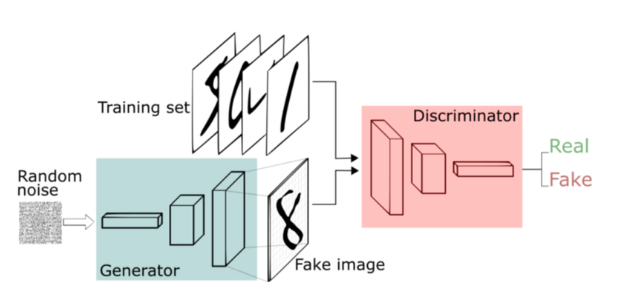

### DCGAN
GAN 중 합성곱 층(Convolutional Layer)으로 이루어진 딥러닝 모델을 DCGAN (Deep Convolutional GAN)이라고 한다. 

#### 생성자 모델
![](https://images.velog.io/images/guide333/post/9d7fcddc-6914-449b-97f9-5c61ec6e9abb/Screenshot%20from%202021-02-23%2011-41-46.png)

정규 분포로부터 뽑은 100개의 숫자(코드라 부름)를 입력으로 받고, 이미지를 출력한다. 코드가 증가할수록 생성되는 이미지도 크기가 증가하면서 변화한다. 이는 모델이 몇 개의 예를 암기하는 것이 아니라 기존 데이터셋의 이미지의 특성을 배우는 것을 의미한다. 

#### 판별자 모델 
판별자는 가짜 이미지와 진짜 이미지를 입력받으면 각 이미지 별로 '진짜라고 판단하는 정도'값을 출력한다. 생성자와 반대로 Conv2D 층으로 이미지의 크기를 점점 줄이고, Flatten층과 Dense 층을 거쳐 하나의 값을 출력한다. 

#### 손실함수와 최적화함수
딥러닝 모델이 학습하기 위해 필요한 두 가지 함수는 손실함수(loss function)와 최적화 함수(optimizer)이다. 

1. 손실함수 
GAN은 손실함수로 교차 엔트로피(Cross Entropy)를 사용한다. 가까워지기 원하는 두 값이 얼마나 큰 차이가 나는지를 정량적으로 계산 할 때 많이 쓰이는 손실함수로, 판별자는 한 개의 이미지가 가짜인지 진짜인지 나타내는 2개의 클래스 간 분류 문제를 풀어야 하므로, 이진 교차 엔트로피(binary cross entropy)를 사용한다.

Real Image에 대한 라벨을 1, Fake Image에 대한 라벨을 0으로 두었을 때, 각각의 손실함수를 이용해 달성해야 하는 목표하는 결과는 다음과 같다.

- 생성자 : 판별자가 Fake Image에 대해 판별한 값이 1에 가까워지는 것
- 판별자 : Real Image 판별값은 1에, Fake Image 판별값은 0에 가까워지는 것

2. 최적화함수          
Adam을 사용하였다. 


## 순서
0. 작업 환경 구성하기
1. 데이터셋 구성하기
2. 생성자 모델 구현하기
3. 판별자 모델 구현하기
4. 손실함수와 최적화 함수 구현하기
5. 훈련 과정 구현하기
6. 학습 과정 진행하기
7. 시각화하기
8. GAN 훈련 과정 개선하기

## STEP 0. 작업환경 구성하기
다음과 같이 작업환경을 구성한다.
```python
$ mkdir -p ~/aiffel/dcgan_newimage/cifar10/generated_samples
$ mkdir -p ~/aiffel/dcgan_newimage/cifar10/training_checkpoints
$ mkdir -p ~/aiffel/dcgan_newimage/cifar10/training_history
```

## STEP 1. 데이터셋 구성하기

In [1]:
# 라이브러리 불러오기
import os
import glob
import time

import PIL
import imageio
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
from IPython import display
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

import warnings
warnings.filterwarnings(action='ignore')

Duplicate key in file PosixPath('/home/aiffel-dj44/Downloads/aiffel/envs/aiffel/lib/python3.7/site-packages/matplotlib/mpl-data/matplotlibrc'), line 253 ('font.family:  sans-serif')


CIFAR-10 데이터셋은 tf.keras 안에 있는 datasets에 포함되어 있어서, 아래와 같이 손쉽게 데이터셋을 구성할 수 있다.

In [2]:
# 데이터 불러오기
cifar10 = tf.keras.datasets.cifar10

# 학습, 평가 데이터 나눠주기
(train_x, _), (test_x, _) = cifar10.load_data()  # 언더스코어로 필요없는 데이터 무시

train_x.shape, test_x.shape

((50000, 32, 32, 3), (10000, 32, 32, 3))

CIFAR-10 데이터셋은 학습 데이터 50000장, 평가 데이터 10000장으로 총 60000장으로 이루어져 있고, 이미지의 크기는 32x32이다. 또한 channel이 3이므로 컬러 이미지이다. 

[The CIFAR-10 dataset](https://www.cs.toronto.edu/~kriz/cifar.html)에 의하면 CIFAR-10 데이터셋은 각 클래스당 6천개의 이미지(학습, 평가 이미지 모두 포함)로 구성되어 있다. 학습데이터는 5개의 배치로 나눠져 있고, 평가데이터는 1개의 배치이다.학습데이터의 배치는 각 클래스 당 5000개의 이미지로 구성되어 있다. 클래스는 'airplane, automobile, bird, cat, deer, dog, frog, horse, ship, truck'로 총 10개이다. 

In [3]:
print("max pixel:", train_x.max(), test_x.max())
print("min pixel:", train_x.min(), test_x.min())

max pixel: 255 255
min pixel: 0 0


CIFAR-10의 이미지의 각 픽셀은 0-255 사이의 정수값을 가진다. 중간값을 0으로 맞춰주기 위해 127.5를 뺀 후 127.5로 나누어 각 픽셀을 -1, 1로 정규화시킨다. 

In [4]:
# 각 픽셀을 (-1, 1)로 정규화
train_x = (train_x - 127.5) / 127.5 # 이미지를 [-1, 1]로 정규화

print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

max pixel: 1.0
min pixel: -1.0


In [7]:
train_x = (train_x + 1) / 2   # 이미지를 [0,1]로 변화

[-1, 1]로 정규화시킨 이미지를 출력하면 'Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).'라는 에러 메시지가 나오므로 이미지를 [0, 1]로 변화시켰다.

In [5]:
# 데이터셋의 shape 확인
train_x.shape

(50000, 32, 32, 3)

train데이터셋에는 5만장의 32x32x3의 이미지가 들어 있다. 로드한 학습 데이터를 시각화를 통해 확인한다. [-1, 1]로 정규화시킨 이미지를 출력하면 'Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).'라는 에러 메시지가 나오므로 이미지를 [0, 1]로 변화시켰다.

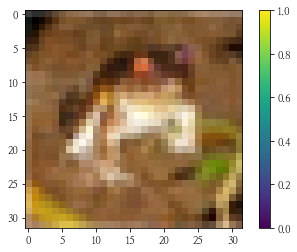

In [6]:
# Image = np.clip(train_x[0], 0, 1) : 이 방법을 사용해도 된다. 
image_x = (train_x + 1) / 2.0   # 이미지를 [0,1]로 변화
plt.imshow(image_x[0])
plt.colorbar()
plt.show()

여러 장의 이미지를 랜덤으로 뽑아 확인해 본다.

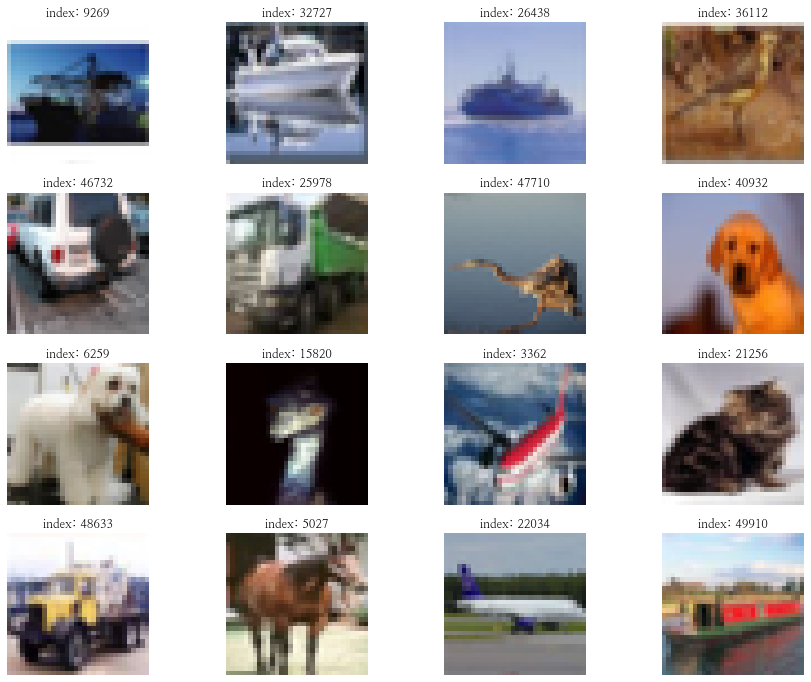

In [7]:
# Image = np.clip(train_x[0], 0, 1) : 이 방법을 사용해도 된다. 
plt.figure(figsize=(15,12))

for i in range(16):
    plt.subplot(4, 4, i+1) 
    random_index = np.random.randint(1, 50000)
    plt.imshow((train_x[random_index] + 1)/2.0)
    plt.title(f'index: {random_index}')
    plt.axis('off')
    
plt.show()

BUFFER_SIZE은 전체 데이터를 섞기 위해 50,000으로 설정한다. 한 번에 많은 양을 학습시키면 비효율적이고 한 번 학습할 때 오래 걸리므로 미니배치 학습을 한다. 

In [8]:
BUFFER_SIZE = 50000
BATCH_SIZE = 256

```tf.data.Dataset``` 모듈의 ```from_tensor_slices()``` 함수를 사용하여 미니배치 데이터셋을 구성한다.

In [9]:
train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
train_dataset

<BatchDataset shapes: (None, 32, 32, 3), types: tf.float64>

## STEP 2. 생성자 모델 구현하기
이제 DCGAN(Deep Convolutional GAN)을 구현한다. 모델의 구현은 Keras Sequential API를 활용하였다. 아래의 그림을 참고로 하여 생성자 모델의 입출력 shape와 모델 구조를 변경하였다.

![](https://images.velog.io/images/guide333/post/9d7fcddc-6914-449b-97f9-5c61ec6e9abb/Screenshot%20from%202021-02-23%2011-41-46.png)

GAN을 학습하는 과정은 모델 구조, learning_rate, 파라미터 초기화, 생성자와 판별자의 경쟁 관계, 데이터의 특성 등을 고려해야 한다. 

In [10]:
def make_generator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Dense layer
    # 입력 벡터: (batch_size, 100) 형태의 노이즈 벡터
    model.add(layers.Dense(4*4*512, use_bias=False, input_shape=(100, )))  # 4 x 4 x 512 = 8192개의 노드
    model.add(layers.BatchNormalization())    # 신경망의 가중치가 폭발하지 않도록 가중치 값을 정규화
    model.add(layers.LeakyReLU(alpha=0.2))
    
    # 첫번째 레이어를 지난 결과물: (batch_size, 8192) 형상의 벡터
    
    # Second: Reshape layer
    # Convolutional 연산을 하도록 1차원 벡터를 (4, 4, 512) 형상의 3차원 벡터로 변환
    model.add(layers.Reshape((4, 4, 512)))
    model.add(layers.Dropout(0.5))
    
    # Third: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(256, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))
    
    # Fourth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Fifth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, \
                                     activation='tanh'))  
    # tanh: -1과 1사이의 값으로 픽셀값을 정규화한 데이터셋과 동일하게 하기 위해 사용
    # 세번째 Conv2DTranspose (32, 32, 3)
    
    return model

Conv2DTranspose 층은 일반적인 이미지 사이즈를 넓혀주는 층이다. 이 모델에서는 세 번의 Conv2DTranspose 층을 이용해 (4, 4, 512) → (8, 8, 256) → (16, 16, 128) → (32, 32, 3) 순으로 이미지를 키운다. 최종 사이즈인 (32, 32, 3)은 준비했던 데이터셋과 크기가 동일하다.

In [11]:
generator = make_generator_model()

generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8192)              819200    
_________________________________________________________________
batch_normalization (BatchNo (None, 8192)              32768     
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 8192)              0         
_________________________________________________________________
reshape (Reshape)            (None, 4, 4, 512)         0         
_________________________________________________________________
dropout (Dropout)            (None, 4, 4, 512)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 8, 8, 256)         3276800   
_________________________________________________________________
batch_normalization_1 (Batch (None, 8, 8, 256)         1

tf.random.normal을 이용하면 가우시안 분포에서 뽑아낸 shape=(1, 100)의 형상을 가지는 랜덤 노이즈 벡터를 생성한다. 

In [12]:
noise = tf.random.normal([1, 100])

텐서플로우 2.0 버전에서는 레이어와 모델에 call 메소드를 구현해 놓기 때문에, 방금 만들어진 생성자 모델에 입력값으로 노이즈를 넣고 바로 모델을 호출하면 간단히 결과 이미지가 생성된다 (내부적으로는 생성자의 call 함수 호출).

그러나 학습하는 중이 아니므로 training=False를 설정한다. Batch Normalization 레이어는 훈련 시기와 추론(infernce) 시기의 행동이 다르기 때문에 training=False을 주어야 올바른 결과를 얻을 수 있다.

In [13]:
generated_image = generator(noise, training=False)
generated_image.shape

TensorShape([1, 32, 32, 3])

첫 번째 1은 1개(batch_size=1)라는 뜻을, 그 뒤로는 (32, 32, 3) 사이즈 이미지가 생성되었다는 뜻이다.

생성 모델에 의해 이미지가 생성자 출력 규격에 잘 맞는지 시각화한다. matplotlib 라이브러리는 2차원 이미지만 보여줄 수 있으므로 0번째와 3번째 축의 인덱스를 0으로 설정해서 (32, 32) shape의 이미지를 꺼낸다.

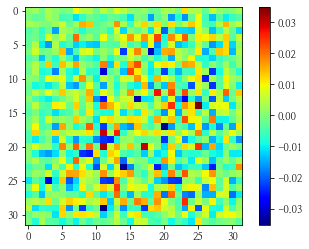

In [14]:
plt.imshow(generated_image[0, :, :, 0], cmap='jet')
matplotlib.rcParams['axes.unicode_minus'] = False
plt.colorbar()
plt.show()

-1과 1 사이의 값에서 잘 생성된 것을 확인할 수 있다. 

## STEP 3. 판별자 모델 구현하기
판별자는 가짜 이미지와 진짜 이미지를 입력받아 각 이미지별로 '진짜'라고 판단하는 실숫값을 출력해야 한다. 따라서 (32, 32, 3)의 이미지를 입력으로 받아 1dim을 판별결과를 출력하는 판별자 모델 구현 함수를 작성한다.

In [15]:
def make_discriminator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Conv2D Layer
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))
    # First: Conv2D Layer 결과: (16, 16, 128)
    
    # Second: Conv2D Layer
    model.add(layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))
    # First: Conv2D Layer 결과: (8, 8, 256)
    
    # Third: Flatten Layer - 3차원 이미지 → 1차원 (1, 16384) 형상의 벡터로 변환
    model.add(layers.Flatten())

    # Fourth: Dense Layer - 하나의 값 출력 
    model.add(layers.Dense(1))

    return model

Conv2DTranspose 층을 사용해서 이미지를 키워나갔던 생성자와 반대로, 판별자는 Conv2D 층으로 이미지의 크기를 점점 줄인다. 첫 번째 Conv2D 층에서 입력된 [32, 32, 3] 사이즈의 이미지는 Conv2DTranspose 층을 거치면서 (32, 32, 3) → (16, 16, 128) → (8, 8, 256)까지 줄어들게 됩니다.

다음에는 Flatten 층을 사용해 3차원 이미지를 1차원으로 쭉 펴서 8x8x256=16384, 즉 (1, 16384) 형상의 벡터로 변환한다. 이는 생성자의 Reshape 층에서 1차원 벡터를 3차원으로 변환했던 것과 정확히 반대이다. 마지막으로 Dense Layer를 거쳐 단 하나의 값을 출력한다.

In [16]:
discriminator = make_discriminator_model()

discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 16, 16, 128)       9728      
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 16, 16, 128)       0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 8, 8, 256)         819456    
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 8, 8, 256)         0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 8, 8, 256)         0         
_________________________________________________________________
flatten (Flatten)            (None, 16384)            

위에서 생성했던 가짜 이미지를 판별자에 입력시켜 본다. 

In [17]:
decision = discriminator(generated_image, training=False)
decision

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[-0.00133139]], dtype=float32)>

텐서플로우의 텐서 형태로 출력이 되었다. 그러나 이 값은 아무런 의미가 없는 값이다.

## STEP 4. 손실함수와 최적화 함수 구현하기

### 1) 손실함수
GAN은 손실함수로 교차 엔트로피(Cross Entropy)를 사용한다. 가까워지기 원하는 두 값이 얼마나 큰 차이가 나는지를 정량적으로 계산 할 때 많이 쓰이는 손실함수로, 판별자는 한 개의 이미지가 가짜인지 진짜인지 나타내는 2개의 클래스 간 분류 문제를 풀어야 하므로, 이진 교차 엔트로피(binary cross entropy)를 사용한다. (진짜: 1, 가짜: 0)

여기서는 tf.keras.losses의 BinaryCrossEntropy 클래스를 사용하는데, BinaryCrossEntropy 클래스는 입력값을 0-1 사이에 분포하는 확률값이라고 가정하한다. 그러나 위에서 만든 판별자 모델에는 실수값을 정규화시키는 활성화 함수(sigmoid나 tanh 함수 등)이 없으므로 ```from_logits=True``` 로 설정하여 BinaryCrossEntropy에 입력된 값을 함수 내부에서 sigmoid 함수를 사용해 0~1 사이의 값으로 정규화하여 계산한다. 

In [18]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

cross_entropy를 활용해 계산할 loss들은 fake_output와 real_output, 두 가지를 활용한다. tf.ones_like()와 tf.zeros_like() 함수를 활용해 fake_output과 real_output을 각각 1 또는 0에 비교를 한다. 이 함수들은 특정 벡터와 동일한 크기이면서 값은 1 또는 0으로 가득 채워진 벡터를 만들고 싶을 때 사용한다. 

- tf.ones_like() 함수: 특정 벡터와 동일한 함수크기면서 값은 1로 가득 채워진 벡터로 만듬
- tf.zeros_like() 함수: 특정 벡터와 동일한 함수크기면서 값은 0로 가득 채워진 벡터로 만듬

generator_loss는 fake_output가 1에 가까워지기를 바라므로 , 다음과 같이 tf.ones_like와의 교차 엔트로피값을 계산한다. 

In [19]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

discriminator_loss는 real_output 값은 1에 가까워지고, fake_output 값은 0에 가까워지기를 바라므로 두 loss값을 모두 계산한다. real_output은 1로 채워진 벡터와, fake_output은 0으로 채워진 벡터와 비교한 후, 최종 discriminator_loss는 그 둘을 더한다. (discriminator_loss는 1에 가까운 것이 좋다.)

In [20]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

판별자가 real output, fake output을 얼마나 정확히 판별하는지의 accuracy를 계산하고, 두 accuracy를 따로 계산해서 비교해 보는 것은 중요하다. 

만약 판별자가 real output과 fake output을 accuracy가 1.0에 가까울 정도로 정확하게 판별해 낸다면 생성자가 만들어내는 fake output이 real output과 차이가 많이 나기 때문에 판별자가 매우 쉽게 판별해 내고 있다는 뜻이다. 따라서 __real accuracy와 fake accuracy는 초반에는 1.0에 가깝게 나오다가, 서서히 낮아져서 둘 다 0.5에 가까워지는 것__ 이 좋다. fake accuracy가 1.0에 더 가깝다면 아직은 생성자가 판별자를 충분히 잘 속이지 못하고 있다는 뜻이다.

In [21]:
def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_accuracy, fake_accuracy

위의 함수를 설명하면 다음과 같다. 
1. tf.math.greater_equal(real_output, tf.constant([0.5])): real_output와 fake_output의 각 원소가 0.5 이상이면 True, 이하면 False로 판별,
2. tf.cast(1), tf.float32): 1의 결과가 True이면 1.0, False이면 0.0으로 변환,
3. tf.reduce_mean(2): 2의 결과를 평균내어 이번 배치의 정확도를 계산한다. 

### 2) 최적화함수
최적화 함수로 Adam을 사용한다. Adam 함수는 tf.keras.optimizers 안에 있고, 중요한 하이퍼 파라미터인 "learning rate"는 여러 가지로 값을 바꾸어 가며 학습을 진행해 본다.

In [22]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(4e-4, beta_1=0.5)

In [23]:
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])
seed.shape

TensorShape([16, 100])


- 생성자와 판별자를 최적화하는 optimizer를 정의합니다.


## STEP 5. 훈련과정 상세 기능 구현하기
    
- 16개의 고정된 seed를 입력으로 하여 훈련 과정 동안 생성한 이미지를 시각화하는 generate_and_save_images() 함수를 구현해 봅시다.
- 훈련 epoch마다 생성자/판별자의 loss 및 판별자의 실제/생성(real/fake) 이미지 판별 accuracy 히스토리(history)를 그래프로 시각화하는 draw_train_history() 함수를 구현해 봅시다.
- training_checkpoints 디렉토리에 몇 epoch마다 모델을 저장하는 checkpoint 모듈을 설정해 봅시다.

먼저 하나의 미니배치 당 진행할 train_step 함수를 만든다. ```@tf.function``` 데커레이터가 사용된 함수의 입력은 Tensorflow의 graph 노드가 될 수 있는 타입으로 자동변환된다. 

In [24]:
@tf.function
def train_step(images):  #(1) 입력데이터
    noise = tf.random.normal([BATCH_SIZE, noise_dim])  #(2) 생성자 입력 노이즈

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:  #(3) tf.GradientTape() 오픈
        generated_images = generator(noise, training=True)  #(4) generated_images 생성

        #(5) discriminator 판별
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        #(6) loss 계산
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

        #(7) accuracy 계산
        real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output) 
    
    #(8) gradient 계산
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    #(9) 모델 학습(가중치 갱신)
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_accuracy, fake_accuracy  #(10) 리턴값

한 단계씩 학습할 train_step과 함께 일정 간격으로 학습 현황을 볼 수 있는 샘플을 생성하는 함수를 만든다. 고정된 seed를 이용해서 결과물을 만들어내므로, 고정된 seed에 대한 결과물이 얼마나 나아지고 있는지를 확인할 수 있다.

In [25]:
def generate_and_save_images(model, epoch, it, sample_seeds):

    predictions = model(sample_seeds, training=False)

    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow((predictions[i] + 1) / 2.0)  # [0, 1]의 크기로 만듬
        plt.axis('off')

    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/generated_samples3/sample_epoch_{:04d}_iter_{:03d}.png'
                    .format(os.getenv('HOME'), epoch, it))

    plt.show()

학습 과정을 체크하기 위해 loss와 accuracy 그래프를 시각화한다. GAN의 학습 과정은 두 모델이 서로의 학습 과정에 영향을 주고받는다. train_step() 함수가 리턴하는 gen_loss, disc_loss, real_accuracy, fake_accuracy 이상 4가지 값을 history라는 dict 구조에 리스트로 저장하고 있다가 매 epoch마다 시각화하는 함수를 만든다.

In [26]:
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 6    # matlab 차트의 기본 크기를 15,6으로 지정해 줍니다.

def draw_train_history(history, epoch):
    # summarize history for loss  
    plt.subplot(211)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')  

    # summarize history for accuracy  
    plt.subplot(212)  
    plt.plot(history['fake_accuracy'])  
    plt.plot(history['real_accuracy'])  
    plt.title('discriminator accuracy')  
    plt.ylabel('accuracy')  
    plt.xlabel('batch iters')  
    plt.legend(['fake_accuracy', 'real_accuracy'], loc='upper left')  
    
    # training_history 디렉토리에 epoch별로 그래프를 이미지 파일로 저장합니다.
    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/training_history3/train_history_{:04d}.png'
                    .format(os.getenv('HOME'), epoch))
    plt.show()

tf.train.Checkpoint를 활용하여 정기적으로 모델을 저장하기 위한 checkpoint를 만든다. checkpoint에는 optimizer와 생성자, 구분자가 학습한 모델 가중치를 모두 넣어 저장한다. 

In [27]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints3'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## STEP 6. 학습 과정 진행하기
- 위 STEP 5에서 구현한 기능들을 활용하여 __최소 50 epoch__ 만큼의 모델 학습을 진행해 봅시다.
- 학습 과정에서 생성된 샘플 이미지로 만든 gif 파일을 통해 학습 진행 과정을 시각적으로 표현해 봅시다.
- 학습 과정을 담은 샘플 이미지, gif 파일, 학습 진행 그래프 이미지를 함께 제출합니다.


In [28]:
def train(dataset, epochs, save_every):
    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}

    for epoch in range(epochs):
        epoch_start = time.time()
        for it, image_batch in enumerate(dataset):
            gen_loss, disc_loss, real_accuracy, fake_accuracy = train_step(image_batch)
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_accuracy'].append(real_accuracy)
            history['fake_accuracy'].append(fake_accuracy)

            if it % 50 == 0:
                display.clear_output(wait=True)
                generate_and_save_images(generator, epoch+1, it+1, seed)
                print('Epoch {} | iter {}'.format(epoch+1, it+1))
                print('Time for epoch {} : {} sec'.format(epoch+1, int(time.time()-epoch_start)))

        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, it, seed)
        print('Time for training : {} sec'.format(int(time.time()-start)))

        draw_train_history(history, epoch)

In [29]:
save_every = 5
EPOCHS = 200

# 사용가능한 GPU 디바이스 확인
tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

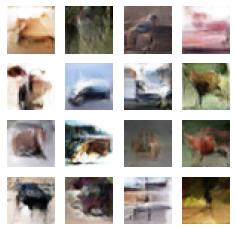

Time for training : 4980 sec


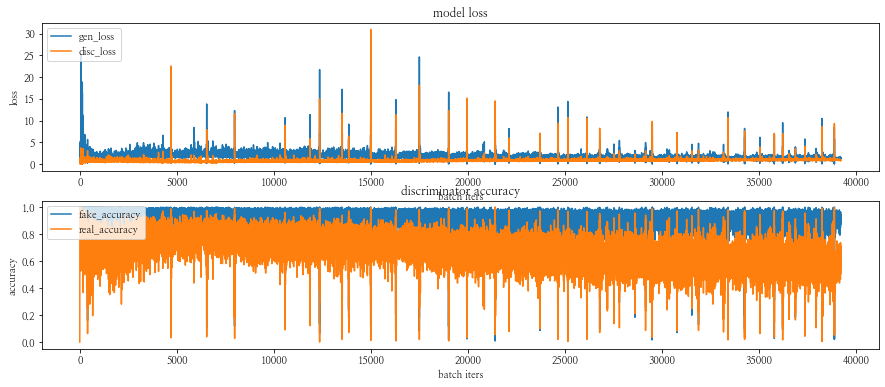

In [30]:
# 학습 시작

# %%time   # cell코드를 모두 수행 후, 수행된 시간 측정 반환하는 매직 커맨드
train(train_dataset, EPOCHS, save_every)

loss와 accuracy 그래프를 보면서 진행 과정을 수시로 확인해 본다. 

만약 생성자가 만든 Fake Image에 대한 판별자의 Accuracy(fake_accuracy)가 계속 1에 가깝게 유지되고 있다면, 생성자가 만든 이미지가 아직 판별자를 성공적으로 속이지 못하고 있다는 뜻이다.

- 좋은 성능일 경우           
loss가 모두 1에 가까워야 하고, accuracy는 0.5에 가까워야 한다.       


- 성능 높이는 방법        
1. 더 많은 epoch로 학습
2. 모델 구조 바꾸기
3. 학습 방법 바꾸기
4. learning rate 바꾸기 

## Step 7. 학습과정 시각화하기
학습 진행 과정을 확인해 보기 위해 학습이 끝난 후 우리가 생성했던 샘플 이미지들을 합쳐 GIF 파일로 만든다. 

GIF 파일은 imageio 라이브러리를 활용해 만들 수 있다. imageio.get_writer를 활용해서 파일을 열고, 거기에 append_data로 이미지를 하나씩 붙여나간다. 

In [31]:
anim_file = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/cifar10_dcgan3.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('{}/aiffel/dcgan_newimage/cifar10/generated_samples3/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

!ls -l ~/aiffel/dcgan_newimage/cifar10/cifar10_dcgan3.gif


-rw-rw-r-- 1 aiffel-dj44 aiffel-dj44 2511593  2월 28 21:49 /home/aiffel-dj44/aiffel/dcgan_newimage/cifar10/cifar10_dcgan3.gif


## STEP 8. (optional) GAN 훈련 과정 개선하기
(참고) 노드에서 추천한 페이지들에서 개선을 위한 아이디어를 얻었다.

[How to Train a GAN? Tips and tricks to make GANs work](https://github.com/soumith/ganhacks)          
[10 Lessons I Learned Training GANs for one Year](https://towardsdatascience.com/10-lessons-i-learned-training-generative-adversarial-networks-gans-for-a-year-c9071159628)         
[Tips for Training Stable Generative Adversarial Networks](https://machinelearningmastery.com/how-to-train-stable-generative-adversarial-networks/)        
[Improved Techniques for Training GANs(paper)](https://papers.nips.cc/paper/2016/file/8a3363abe792db2d8761d6403605aeb7-Paper.pdf)       

1. 첫 번째 시도

- noise_dim = 100
- learning_rate = 1e-4 (generator)
- learning_rate = 1e-4 (discriminator)
- batch_size = 256
- epochs = 100
- alpha = (leaky ReLU)
- beta_1 =  (AdamOptimizer)


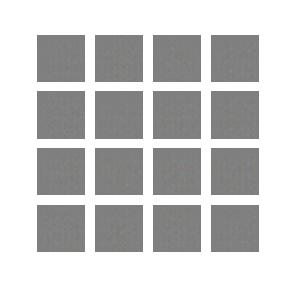

In [34]:
from IPython.display import Image
Image(filename='cifar10_dcgan.gif')

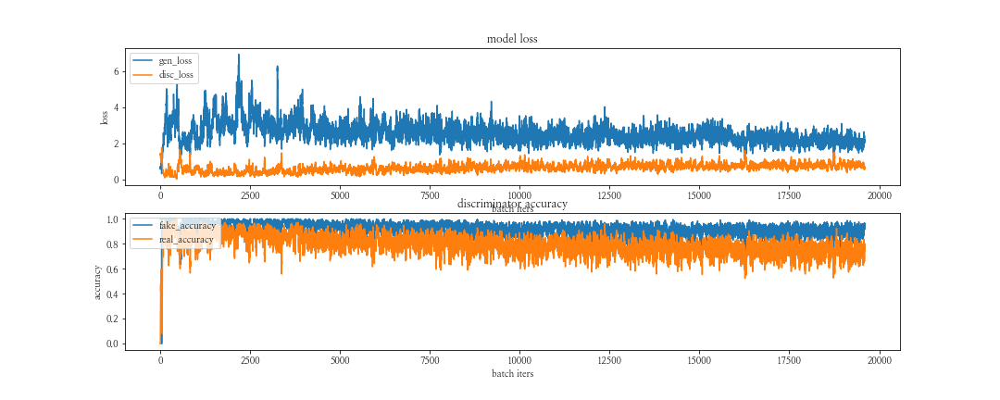

In [35]:
Image(filename='train_history1_0099.png')

노드에서 제시한 대로 학습을 진행하였다. 우선 생성된 이미지의 형태를 잘 알아볼 수 없고, gen_loss는 2, disc_loss는 1에 가깝다. fake accuracy는 1에 가까우므로 생성자가 생성한 이미지가 판별자를 제대로 속이지 못하고 있음을 알 수 있다. 

2. 두 번째 시도     
CS231n에서 추천한 방법을 사용해 보았다.

- noise_dim = 100
- learning_rate = 1e-3 (generator)
- learning_rate = 1e-3 (discriminator)
- batch_size = 256
- epochs = 100
- alpha = 0.2 (leaky ReLU)
- beta_1 = 0.9 (AdamOptimizer)

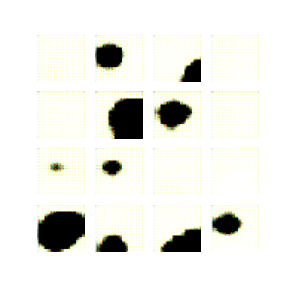

In [36]:
Image(filename='cifar10_dcgan1.gif')

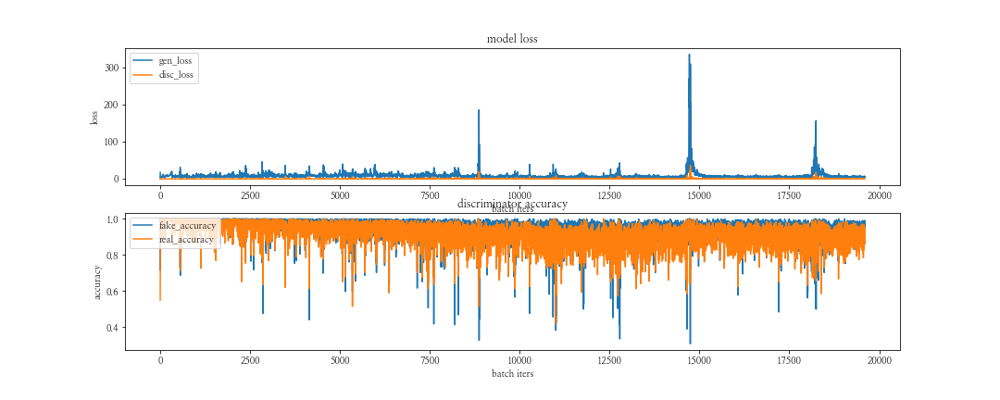

In [37]:
Image(filename="train_history_0099.png")

CS231n에서 추천한 방법대로 learning rate와 Adam의 beta_1을 설정하였으나 이전과 큰 차이는 보이지 않았다. 생성자가 생성한 이미지는 뭉개져 있고, accuracy 역시 1에 가깝다. 두 loss는 0에 가까운 것을 볼 수 있다. 

3. 세 번째 시도     
노드에서 언급한 참고문헌에서 추천한 방법을 사용해 보았다. (하이퍼파라미터 변화, dropout 추가)

- noise_dim = 100
- learning_rate = 2e-4 (generator)
- learning_rate = 2e-4 (discriminator)
- batch_size = 256
- epochs = 200
- alpha = 0.2 (leaky ReLU)
- beta_1 = 0.5 (AdamOptimizer)
- dropout in generator = 0.5

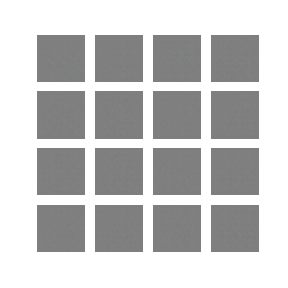

In [38]:
Image(filename='cifar10_dcgan2.gif')

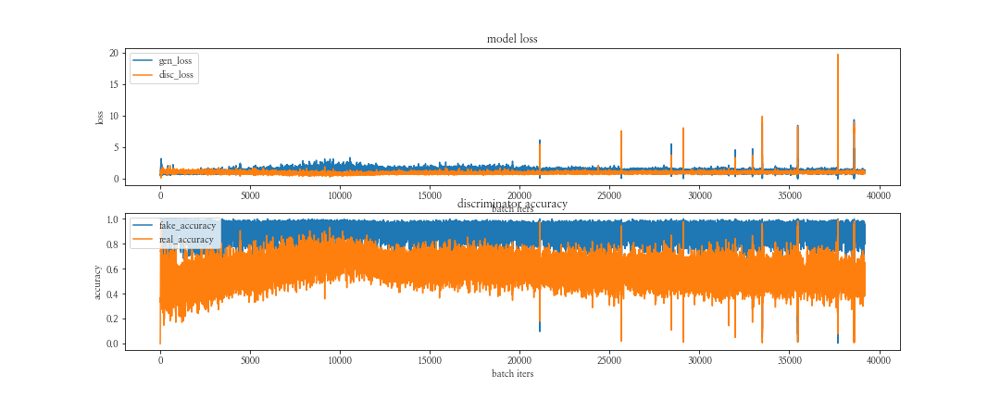

In [39]:
Image(filename="train_history_0199.png")

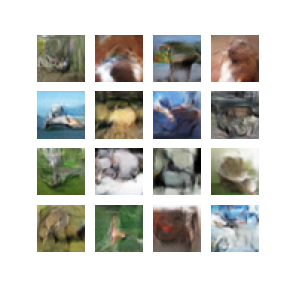

In [43]:
Image(filename="sample_epoch_0200_iter_151.png")

이번에는 epochs을 200으로 늘리고 참고문헌에서 추천한 대로 하이퍼파라미터와 generator에 dropout을 추가하였다. 이미지가 이전보다 훨씬 선명해진 것을 볼 수 있다. loss는 1에 수렴하는 것 같다. real accuracy는 0.5 정도로 낮아졌지만 fake accuracy는 여전히 1에 가깝다. 


4. 네 번째 시도    
마지막으로 [10 Lessons I Learned Training GANs for one Year](https://towardsdatascience.com/10-lessons-i-learned-training-generative-adversarial-networks-gans-for-a-year-c9071159628)를 참고하여 생성자와 판별자의 learning rate를 다르게 해 보았다(TTUR). 위의 이미지에서 모드 붕괴(비슷한 이미지만 생성)는 일어나지 않았으므로 label smoothing은 하지 않았다. 

- noise_dim = 100
- learning_rate = 1e-4 (generator)
- learning_rate = 4e-4 (discriminator)
- batch_size = 256
- epochs = 200
- alpha = 0.2 (leaky ReLU)
- beta_1 = 0.5 (AdamOptimizer)
- dropout in generator = 0.5


- a visual understanding is often more meaningful than some loss numbers.


 

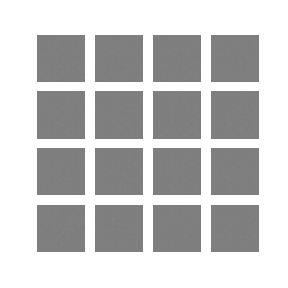

In [40]:
Image(filename='cifar10_dcgan3.gif')

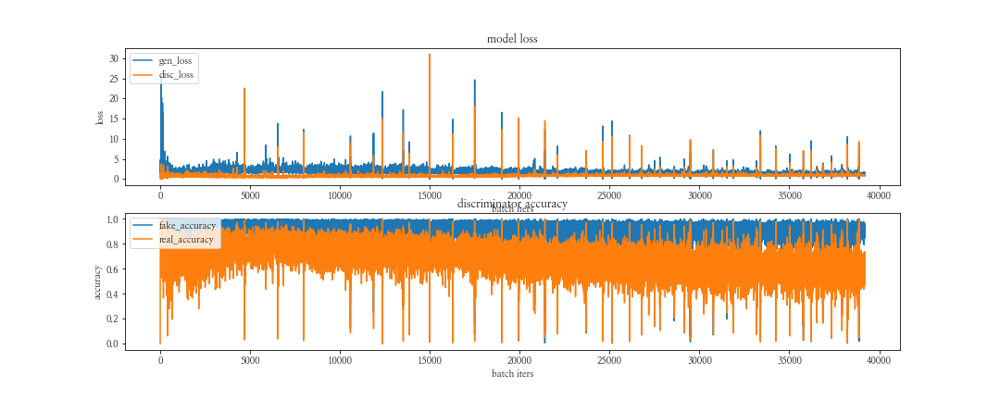

In [41]:
Image(filename="train_history3_0199.png")

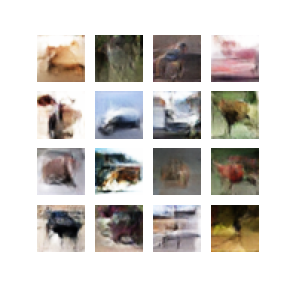

In [44]:
Image(filename="sample_epoch_0200_iter_195.png")

생성된 이미지가 조금 더 선명해진 것 같다. 그러나 fake accuracy는 1에 가깝다. 조금 더 훈련을 해보기로 했다. 

checkpoint 모듈을 이용해 모델을 저장하였기 때문에 모듈을 이용해 학습해 둔 모델을 로드하여 추가학습을 진행하였다. (아래의 코드는 학습한 모델을 활용하여 이미지를 생성해야할 때도 사용 가능하다.)

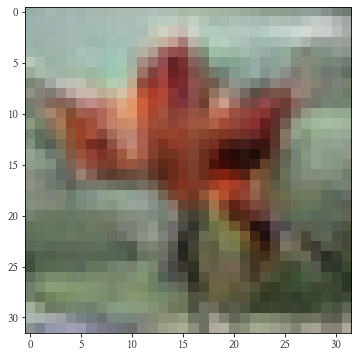

In [45]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints'

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

# 로드한 모델이 정상적으로 이미지를 생성하는지 확인. 
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

np_generated = generated_image.numpy()
np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
np_generated = np_generated.astype(int)
plt.imshow(np_generated[0])
plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 CIFAR-10 이미지가 나온다.

checkpoint를 통해 모델이 로드되었으면 아래 코드를 실행할 경우 로드된 모델의 파라미터 상태에서 훈련을 재개할 수도 있다.

In [46]:
save_every = 5
EPOCHS = 200

# 사용가능한 GPU 디바이스 확인
tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

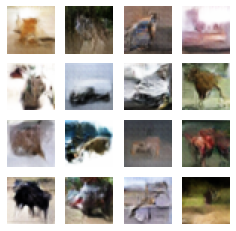

Time for training : 5397 sec


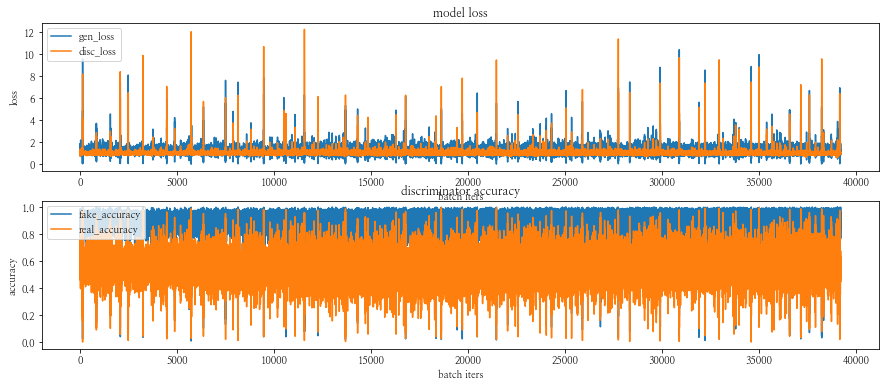

CPU times: user 1h 29min 54s, sys: 1min 19s, total: 1h 31min 14s
Wall time: 1h 29min 59s


In [50]:
%%time
train(train_dataset, EPOCHS, save_every)

In [52]:
anim_file = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/cifar10_dcgan4.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('{}/aiffel/dcgan_newimage/cifar10/generated_samples3/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

!ls -l ~/aiffel/dcgan_newimage/cifar10/cifar10_dcgan4.gif


-rw-rw-r-- 1 aiffel-dj44 aiffel-dj44 2363580  2월 28 23:37 /home/aiffel-dj44/aiffel/dcgan_newimage/cifar10/cifar10_dcgan4.gif


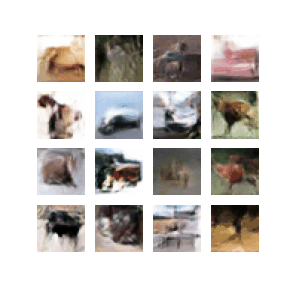

In [53]:
Image(filename='cifar10_dcgan4.gif')

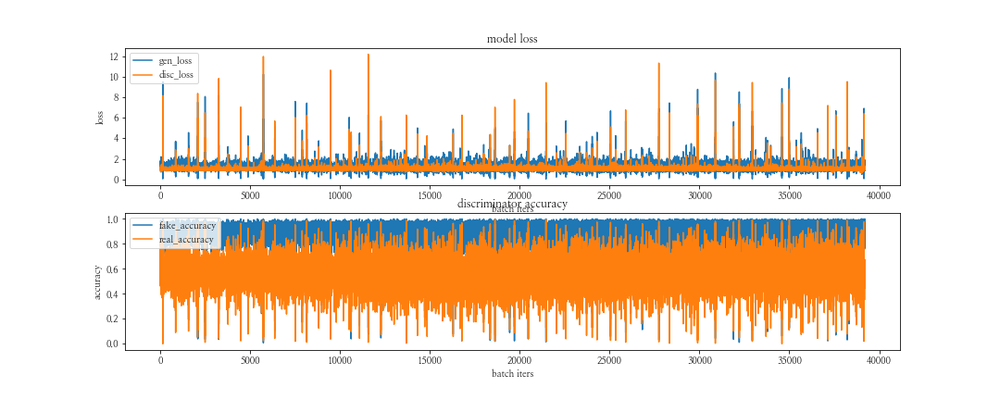

In [54]:
Image(filename="train_history4_0199.png")

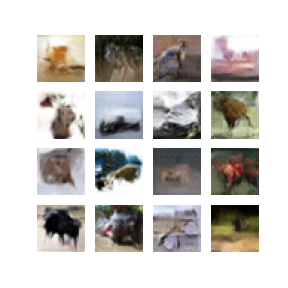

In [51]:
# epochs = 400
Image(filename="sample_epoch_0200_iter1_195.png")

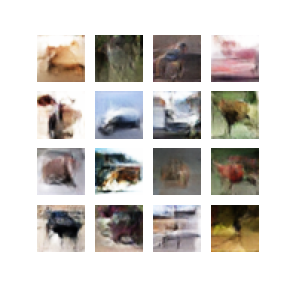

In [44]:
# epochs = 200
Image(filename="sample_epoch_0200_iter_195.png")

200번을 더 돌려보았지만 200번 돌렸을 때와 별 차이가 없어 보인다. fake accuracy도 1에 여전히 가깝고, real accuracy와 loss는 진동하는 폭이 커졌다. 너무 학습을 오래 했기 때문에 oscillating mode가 일어난 것 같다. 

   
mode collapsing이 일어났을 때는 loss 함수 crossentropy에 사용되었던 비교 벡터를 1이 아니라 0.9 정도로 바꾸면 성능이 좋아진다. (그러나 여기서는 mode collapsing이 일어나지 않아 사용하지 않았다.) <참고> [GAN — Ways to improve GAN performance](https://towardsdatascience.com/gan-ways-to-improve-gan-performance-acf37f9f59b)

In [ ]:
# p = tf.placeholder(tf.float32, shape=[None, 10])
# # Use 0.9 instead of 1.0.
# feed_dict = {
#   p: [[0, 0, 0, 0.9, 0, 0, 0, 0, 0, 0]] # Image with label "3"
# }
# # logits_real_image is the logits calculated by 
# # the discriminator for real images.
# d_real_loss = tf.nn.sigmoid_cross_entropy_with_logits(
#                     labels=p, logits=logits_real_image)

## 루브릭
|평가문항|	상세기준|결과|
|:------:|:--------:|:---:|
|1. GAN의 두 모델 구조를 통해 이미지를 성공적으로 생성하였다.|오브젝트 종류를 육안으로 구별할 수 있을 만한 이미지를 생성하였다.|Y     |
|2. 생성 이미지 시각화 및 학습 그래프를 통해 GAN 학습이 바르게 진행되었음을 입증하였다.|gif를 통해 생성이미지 품질이 서서히 향상되는 것과, fake accuracy가 추세적으로 0.5를 향해 하향하고 있음을 확인하였다.|N    |
|3. 추가적인 GAN 모델구조 혹은 학습과정 개선 아이디어를 제안하고 이를 적용하였다.|제출 아이디어를 제출 프로젝트에 반영하고, 그 결과가 아이디어 적용 이전보다 향상되었음을 시각적으로 입증하였다.| Y    |

## 후기
### 이번 프로젝트에서 어려웠던 점
- 처음에 개념을 이해하지 못해서 생성/판별 모델을 설계하는 것이 어려웠다. 생성/판별 모델을 설계할 때 입력과 출력 이미지의 크기를 설정하는 부분이었다. 그러나 그림을 보면서 적용해 보았더니 해결되었다. 
- 이미지를 시각화하는 부분이 조금 어려웠다. 이미지를 자르고, GIF 파일을 가져오는 코드를 찾을 때 시간이 걸렸다. 
- Fake accuracy가 잘 내려가지 않았다. CS231n이나 노드에서 제공한 사이트를 참고하여도 잘 내려가지 않았다. 

### 프로젝트를 진행하면서 알게된 점
- DCGAN의 기본 개념
- CS231n에서 배운 개념들이 어떻게 적용되는지를 알았다. 
- GAN의 단점: 훈련이 어려움, 불안정성(셍성 모델과 판별 모델의 불균형성), 모드 붕괴 등 

### 프로젝트를 진행하면서 아직 모호한 점
- fake accuracy를 낮추기 위한 하이퍼파라미터를 조정하는 방법을 잘 모르겠다. 좋은 결과가 나온다는 하아퍼파라미터를 사용해도 별 차이가 없는 것 같다. epoch도 어느 정도 돌려야 되는 건지 좋은 결과가 나올 수 있는지 모르겠다. 

### 자기 다짐
처음에는 어려워서 헤맸지만 천천히 노드를 다시 보고 나니 재미있어졌다. 모델이 기존의 이미지의 특징을 학습해 자신만의 새로운 이미지를 만든다는 것이 흥미로웠다. 모델을 학습하면서 실제로 이미지가 변해가는 모습도 신기했다. 그러나 결국 fake accuracy를 0.5 가까이에 가도록 하지 못해 아쉽다. 한 번 학습할 때마다 시간이 많이 걸려서 다양한 시도를 하지 못했다. 

이론으로 배웠던 것을 실제로 사용할 때마다 기분이 좋다. 지금까지는 많이 사용하지 못했지만 앞으로는 배웠던 것을 자주 사용할 수 있었으면 한다. 